In [1]:
#IMAGEPATH = "E:/projecten/hercules/verwerkingssoftware/PhenoMate/CLR_E0001P0005N0001.DAT"  # DAT-file van phenovation --> 35114 kB groot

import numpy as np                 
from skimage import exposure       # image processing module to enhance contrast
from skimage import io, color
from skimage import img_as_ubyte
import matplotlib.pyplot as plt

try:
    import png  # backup when skimage backend fails 
except ImportError:
    pass
import os

np.seterr(all = 'ignore')

###############################################################################
# functions
###############################################################################

def read_RGB(IMAGEPATH, dims = (2448,2448,3)):
    """
        Function for reading RGB-bands from CLR.dat file
        
        PARAMETERS
        ----------
        
        IMAGEPATH : str
            absolute or relative path to the .dat file
        
        dims : tuple of ints (m, n, k)
            dimensions of the image 
    """
    f = open(IMAGEPATH, "r")
    a = np.fromfile(f, dtype=np.uint16)
    f.close()
    full = np.reshape(a, dims, order='F')
    return full

def read_SingleBand(IMAGEPATH, dims = (2448,2448), bandNr = 0):
    """
        Function for reading a specific band from a .dat file. Numbers go 
        from 0 to the number of bands in the file minus one (performance issue:
        this function reads the full image and subsequently slices the resulting
        array... performance gains might be obtained when reading selectively ...
        not a real issue at the time of implementation)
        
        PARAMETERS
        ----------
        
        IMAGEPATH : str
            absolute or relative path to the .dat file
        
        dims : tuple of ints (m, n)
            dimensions of the image 
            
        bandNr : int
            band to be read
        
    """
    f = open(IMAGEPATH, "r")
    a = np.fromfile(f, dtype=np.uint16)
    f.close()
    firstNr = (dims[0] * dims[1]) * bandNr
    length = (dims[0] * dims[1])
    full = np.reshape(a[firstNr : firstNr+length], dims, order='F')
    return full
    

def rescale(img, percentiles = None, to_uint8 = False):
    """
        Function that applies histogram stretching on an image, using the
        percentiles of the image histogram percentiles = None. --> to obtain a
        nice-looking image, rescaling is often important!
        
        If percentiles is an (a, b) tuple where a and b are floats, these values
        are used as upper and lower bounds for the stretching.
    """
    
    
    if percentiles is None:
            p2, p98 = np.percentile(img, (2, 98))
            percentiles = (p2, p98)
            
    img = exposure.rescale_intensity(img, in_range=percentiles)
    
    if img.dtype == "float64" and img.min() < 0.0:
        img = (img + 1)/2
        
    if to_uint8:
        img = img_as_ubyte(img, force_copy= True)
    return img
        
    
def save_as_PNG(img, fname , rescale_img = True, percentiles = None):
    """
        Function to save an image array as a png
        
        PARAMETERS
        ----------
        img : np.array
            (m, n, 3) numpy array of RGB values
    """
    if rescale_img:
        img = rescale(img, percentiles = percentiles, to_uint8 = True)
    try:
        io.imsave(fname, img)
    except Exception:
        png.from_array(img, 'RGB').save(fname)



#==============================================================================
# def show_RGB(img, rescale_img = True, percentiles = None):
#      if rescale_img:
#          img = rescale(img, percentiles = percentiles)
#          
#      plt.imshow(np.array(img, dtype=float)/65536)
#==============================================================================



def gray_to_colormapped(img, cmap = "jet"):
    """
        Function to transform a grayscale image into an RGB image using a particular colormap
        typical applications are heat-map like images (using jet - colormap)
    """
    assert img.dtype == 'uint8', "datatype differs from uint8 when performing gray_to_colormapped"
    if cmap == "jet":
        tmp = np.zeros(list(img.shape) + [3], dtype = 'uint8')
        tmp[:,:,0] = 175-np.array(img/1.46, dtype='uint8')
        tmp[:,:,1] = 255
        tmp[:,:,2] = 255
        return img_as_ubyte(color.hsv2rgb(tmp))
    
    elif cmap == "jet inv":
        tmp = np.zeros(list(img.shape) + [3], dtype = 'uint8')
        tmp[:,:,0] = np.array(img/1.46, dtype='uint8')
        tmp[:,:,1] = 255
        tmp[:,:,2] = 255
        return img_as_ubyte(color.hsv2rgb(tmp))
    
    elif cmap == "fv/fm":
        tmp = np.zeros(list(img.shape) + [3], dtype = 'uint8')
        tmp[:,:,0] = np.array(img/3.5, dtype='uint8')
        tmp[:,:,1] = 255
        tmp[:,:,2] = 255
        return img_as_ubyte(color.hsv2rgb(tmp))
    
    elif cmap =='gray':
        return img_as_ubyte(color.gray2rgb(img), force_copy=True)

        

def convert_folder_RGB(img_path_list, percentiles = None):
    cnt = 0
    for fname in img_path_list:
        try:
            img = read_RGB(fname)
            save_as_PNG(img, fname[:-3] + "png", rescale_img = True, percentiles = percentiles)
            cnt += 1
        except Exception:
            pass
    return cnt

def computeImage(image_dict, expression_str):
    """
    Computes the result of computing the expression in expression_str. The keys in image_dict are the variables names in the expression and the values the associated images
    
    TAKE CARE: uses some dirty tricks to avoid the need for tailor-made parser of expressions
    
    """
    d = image_dict
    for key in image_dict:
        expression_str = expression_str.replace(key, "d['" + key + "']")
    
    res = eval(expression_str)
    return res


def rescale_after_computation(im , rescale_method = "bound_to_unitInterval"):
    if rescale_method == "bound_to_unitInterval":
        pass
    elif rescale_method == "use_max":
        return im / np.max(im)
    else:
        return im


def parseExpression(expression, img_path):
    """
        Function to parse an expression and execute it at 'run time'. 
        
        Typical function for the DATimage_GUI --> should be relocated in future implementations
        
        RETURNS
        -------
        
        an (m, n) numpy array
        
    """
    fileTypes_dict = dict()
    # get list of bands
    tmp_expression = expression.replace(']', '] ')
    tmp_expression = ''.join([c for c in tmp_expression if not c in ['+', '-', '*', '/', '(', ')']])
    bands_lst = tmp_expression.split()
    
    # read bands from dat-files
    for band in bands_lst:
        try:
            referenceName = extractReferenceName(img_path)
            dat_file =  os.path.dirname(img_path)+ '/' + band[:3] + referenceName
            nr  = int(band[4])
            single_band = read_SingleBand(dat_file, bandNr = nr)
            fileTypes_dict[band.strip()] = np.array(single_band, dtype = float)
        except Exception as e:
            print("problem during parsing of band (may be ignored if the printed value is not a band)", band, e.__str__())
        
    computed = computeImage(fileTypes_dict, expression)
    computed[np.isnan(computed)] = 0
    computed[np.isinf(computed)] = 0
    return computed
    

def extractReferenceName(img_path):
    baseName = os.path.basename(img_path)
    return baseName[3:]
 

In [2]:
import glob

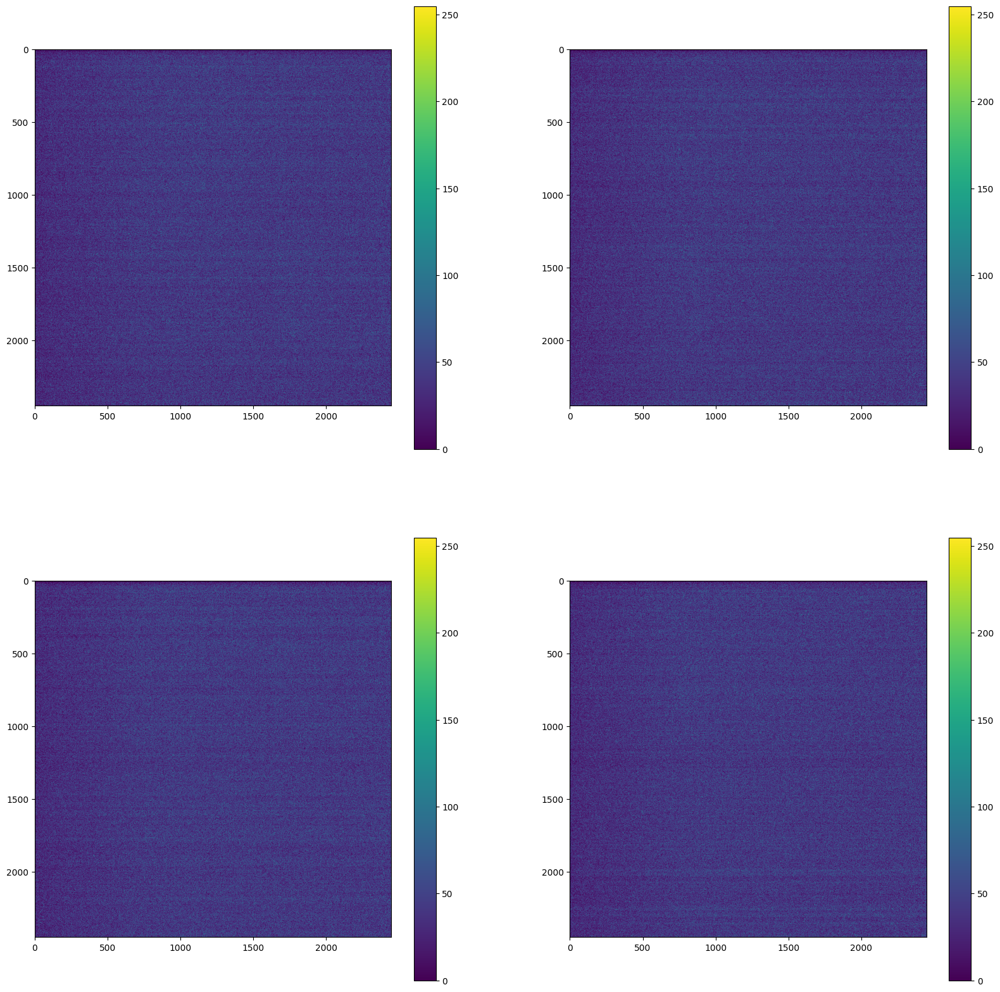

In [3]:
fileIn = sorted(glob.glob("/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CHL*.DAT"))

subplot_ind = [224, 222, 223, 221]

plt.figure(figsize=(20,20))
for f in range(len(fileIn)):
    img = read_SingleBand(fileIn[f])
    im2 = rescale(img,percentiles = None, to_uint8=True)
    plt.subplot(subplot_ind[f])
    plt.imshow(im2)
    plt.colorbar()
plt.show()

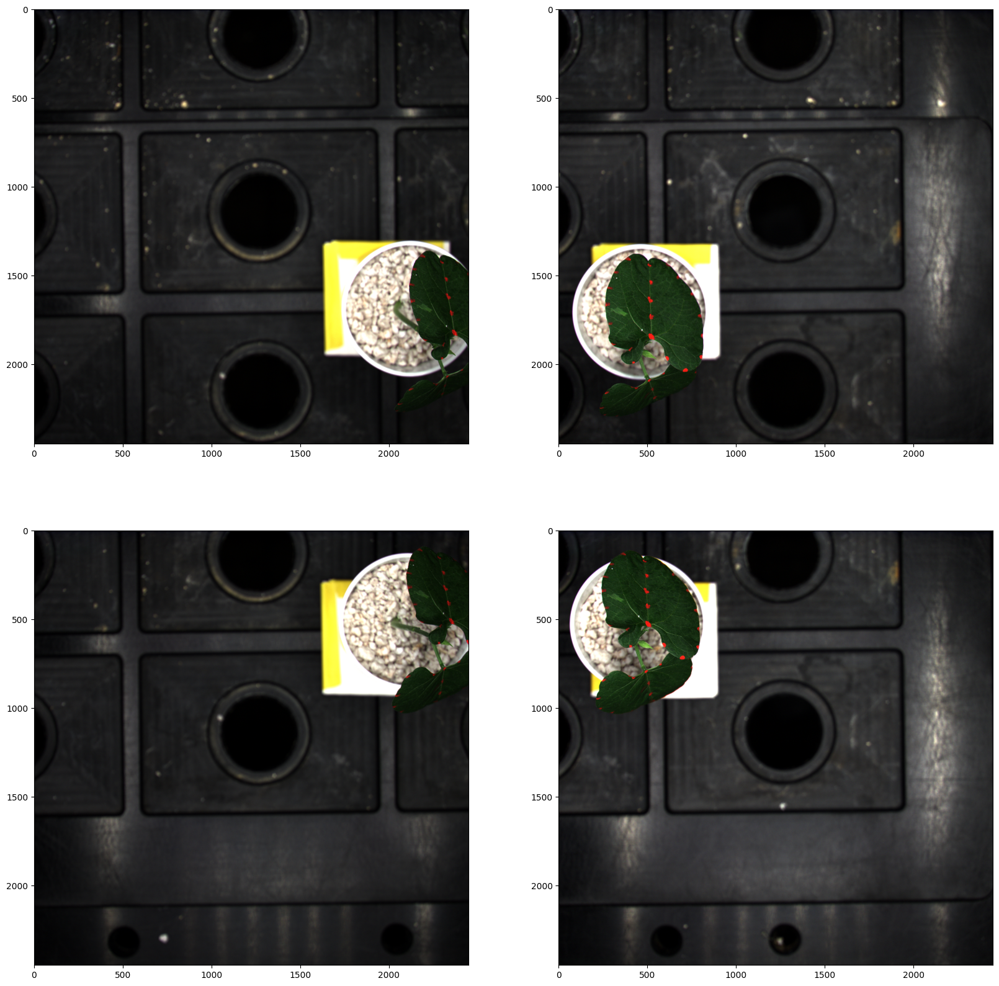

In [61]:
fileIn = sorted(glob.glob(
    "/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CLR*.DAT"))

subplot_ind = [224, 222, 223, 221]

plt.figure(figsize=(20,20))
for f in range(len(fileIn)):
    img = read_RGB(fileIn[f])
    im2 = rescale(img,percentiles = None, to_uint8=True)
    plt.subplot(subplot_ind[f])
    plt.imshow(im2)
plt.show()

In [62]:
fileIn

['/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CLR_E4100P0001N0001.DAT',
 '/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CLR_E4100P0002N0002.DAT',
 '/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CLR_E4100P0003N0003.DAT',
 '/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CLR_E4100P0004N0004.DAT']

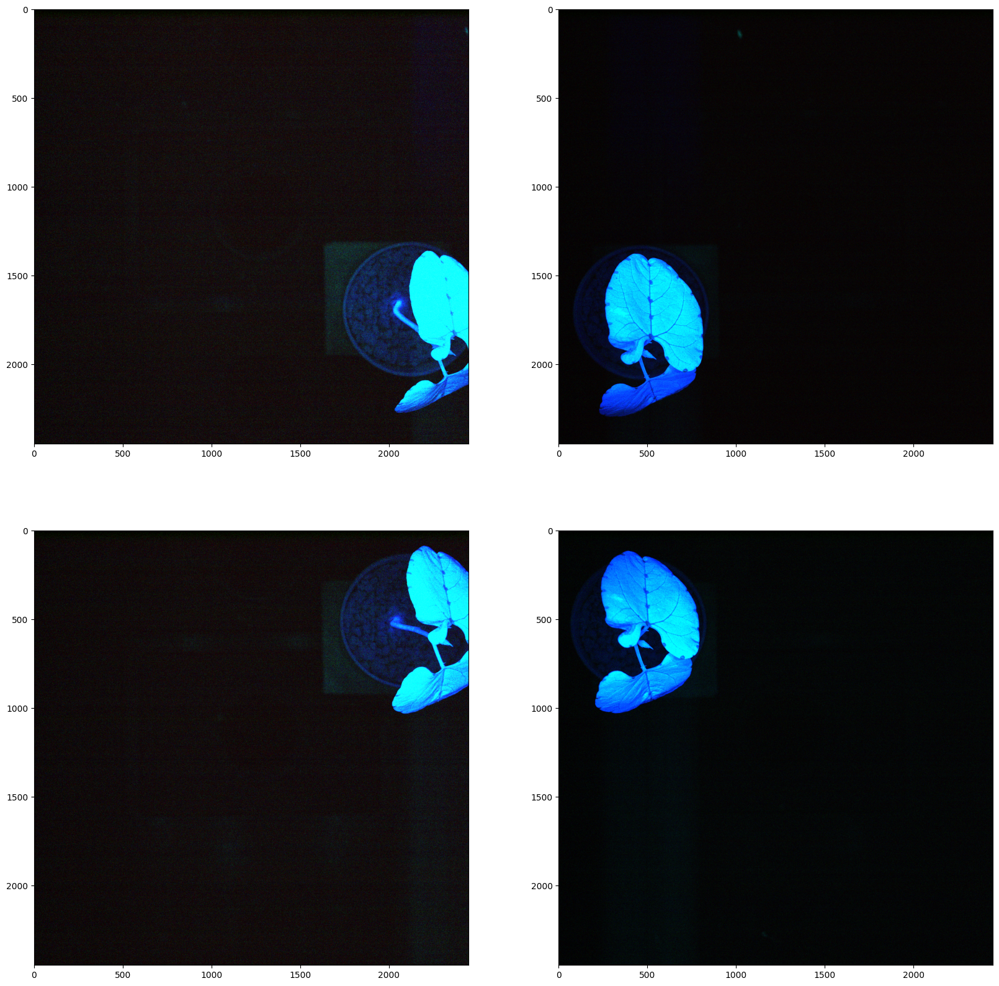

In [5]:
fileIn = sorted(glob.glob("/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/PSD*.DAT"))

subplot_ind = [224, 222, 223, 221]

plt.figure(figsize=(20,20))
for f in range(len(fileIn)):
    img = read_RGB(fileIn[f])
    im2 = rescale(img,percentiles = None, to_uint8=True)
    plt.subplot(subplot_ind[f])
    plt.imshow(im2)
plt.show()


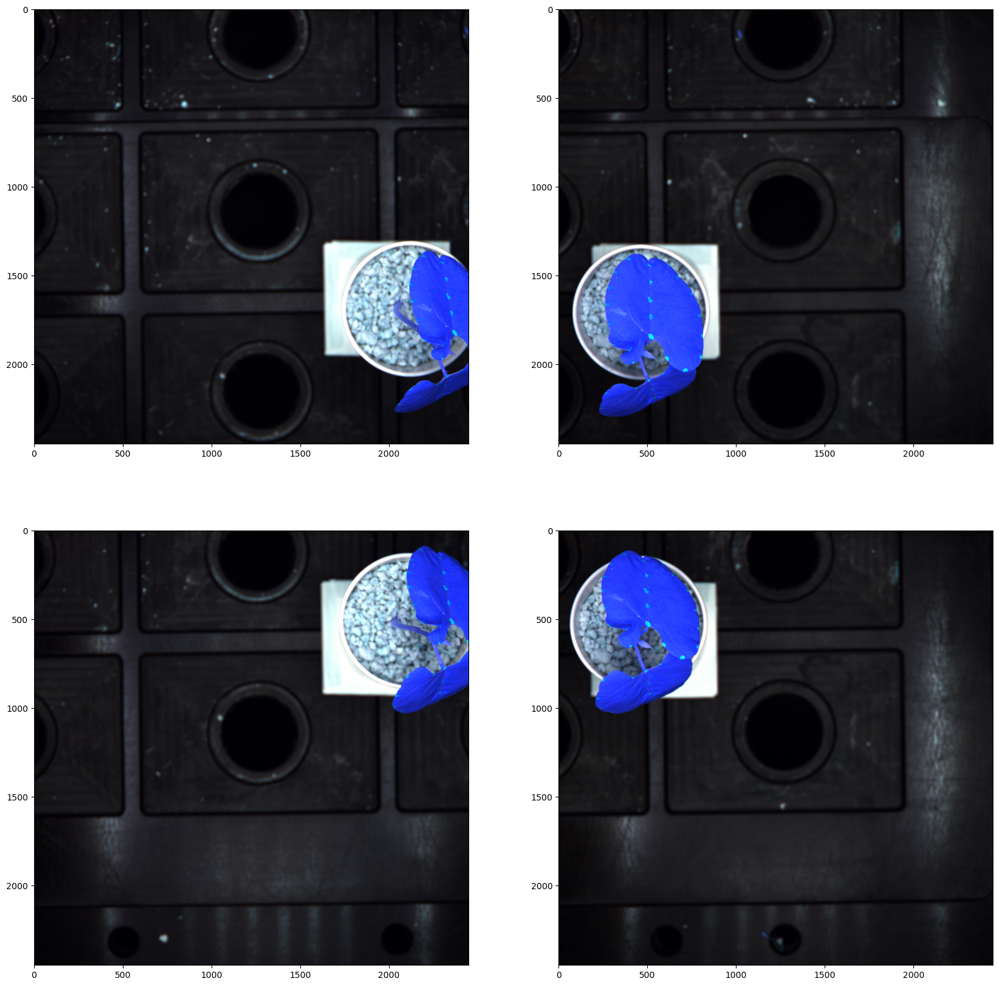

In [59]:
fileIn = sorted(glob.glob("/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/SPC*.DAT"))

subplot_ind = [224, 222, 223, 221]

plt.figure(figsize=(20,20))
for f in range(len(fileIn)):
    img = read_RGB(fileIn[f])
    im2 = rescale(img,percentiles = None, to_uint8=True)
    plt.subplot(subplot_ind[f])
    plt.imshow(im2)
plt.show()


In [60]:

im2.shape

(2448, 2448, 3)

# Rode stippen detecteren 

In [ ]:
fileIn = sorted(glob.glob("/media/joris/OS/data/Thesis_Marten/wetransfer_clr_e4100p0002n0002-dat_2023-09-15_0836/CLR*.DAT"))[0]

img = read_RGB(fileIn)
im2 = rescale(img,percentiles = None, to_uint8=True)

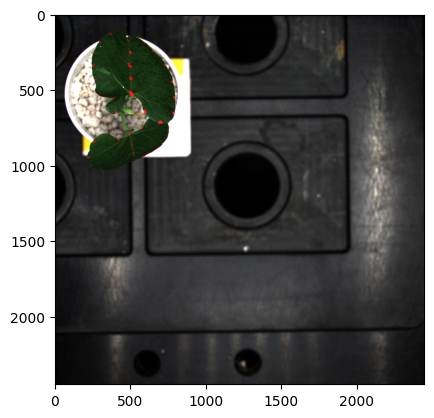

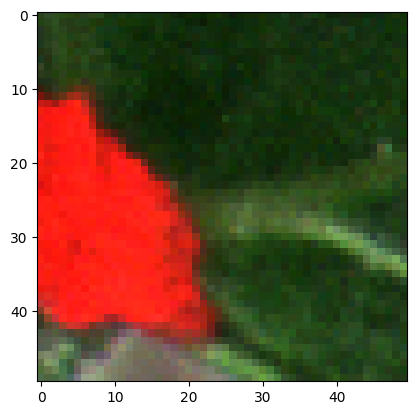

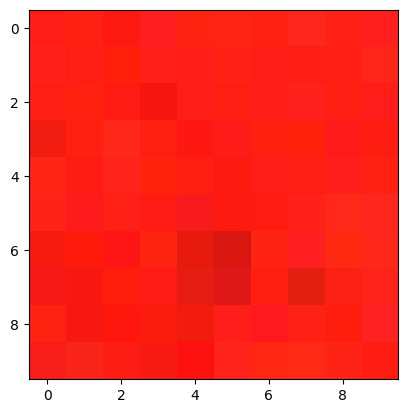

In [12]:
# Zoom manually in on a red spot
plt.figure()
plt.imshow(im2)
plt.show()

plt.figure()
plt.imshow(im2[500:550,500:550])
plt.show()

plt.figure()
plt.imshow(im2[525:535,500:510])
plt.show()

In [26]:
# Extract limits of red
red_min = [im2[525:535,500:510][:,:,c].min() for c in range(3)]
red_max = [im2[525:535,500:510][:,:,c].max() for c in range(3)]
print(red_min)
print(red_max)

[217, 17, 11]
[255, 41, 33]


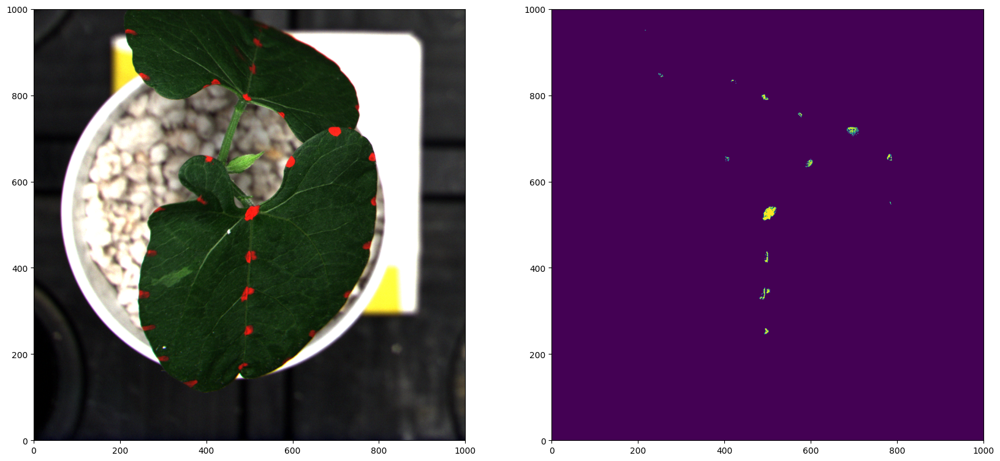

In [58]:
# Find places within these limits
red_detected = np.sum([
    im2[:,:,0] >= red_min[0],
    im2[:,:,0] <= red_max[0],
    im2[:,:,1] >= red_min[1],
    im2[:,:,1] <= red_max[1],
    im2[:,:,2] >= red_min[2],
    im2[:,:,2] <= red_max[2],
    ],
    axis = 0
    ) == 6

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.xlim([0,1000])
plt.ylim([0,1000])
plt.imshow(im2)
plt.subplot(122)
plt.imshow(red_detected)
plt.xlim([0,1000])
plt.ylim([0,1000])
plt.show()

# Graveyard

In [7]:
"""
IMAGEPATH ="E:/.../CLR_E0001P0005N0001.DAT"
img = read_RGB(IMAGEPATH)
im2 = rescale(img,percentiles = None, to_uint8=True)
plt.imshow(im2)
"""





"""
img_path = "E:/projecten/hercules/eigen_beeldverwerking/testfotos/CLR_E0001P0989N0001.DAT"

image_dict = {"a" : np.arange(1,5), "b" : np.arange(3,7)}
expression = 'CLR[1] + CLR[0]'
#computeImage(image_dict, expression_str)

out = parseExpression(expression, img_path)
"""



"""

IMAGEPATH = "E:/projecten/hercules/eigen_beeldverwerking/testfotos/SPC_E0001P0994N0001.DAT" 
im = read_SingleBand(IMAGEPATH, bandNr=1)
im2 = rescale(im, to_uint8=True)
out = gray_to_colormapped(im2)
plt.imshow(out)
show_RGB(im, rescale_img=True, percentiles = None)
save_as_PNG(im, "testsb.png")

"""

'\n\nIMAGEPATH = "E:/projecten/hercules/eigen_beeldverwerking/testfotos/SPC_E0001P0994N0001.DAT" \nim = read_SingleBand(IMAGEPATH, bandNr=1)\nim2 = rescale(im, to_uint8=True)\nout = gray_to_colormapped(im2)\nplt.imshow(out)\nshow_RGB(im, rescale_img=True, percentiles = None)\nsave_as_PNG(im, "testsb.png")\n\n'